In [1]:
import geopandas as gpd
import pandas as pd

from gensim.matutils import corpus2csc
from gensim.corpora import Dictionary
from gensim.models import Word2Vec
from gensim.models.fasttext import FastText

import pickle

from importlib import reload
import ppmi_svd

import matplotlib.pyplot as plt

import nltk
import json
import requests
import numpy as np

In [2]:
# global parameters for plots
plt.style.use("fast")
plt.rcParams['figure.dpi'] = 600
plt.rcParams['figure.figsize'] = (4.45, 3)
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['font.size'] = 8

def save_figure(fig, fig_name):
    fig.savefig("../figures/" + fig_name + ".tiff", dpi=600)
    fig.savefig("../figures/" + fig_name + ".png", dpi=600)

In [3]:
GIST = gpd.read_parquet("../data/large_files/GIST_geocontexts.parquet")
len(GIST)

106898

In [4]:
ids_lines = pickle.load(open("../data/ids_lines.pickle", "rb"))
freqs_tups = pickle.load(open("../data/freqs_tups.pickle", "rb"))

In [5]:
religion_final = ["θεός", "Ζεύς", "εὐσεβής", 'ἱερός']
morality_final = ["ἀγαθός", "ἀρετή", "δίκαιος", "τιμή"]

In [6]:
N_types_covered = 1000
vocab = [tup[0] for tup in freqs_tups[:N_types_covered]]
dictionary = Dictionary([vocab])

In [7]:
dictionary.doc2bow(["θεός", "θεός","Ζεύς", "nonexistent", "εὐσέβεια", 'ἱερεύς', "θυσία"])

[(35, 1), (293, 2), (299, 1), (931, 1)]

In [8]:
dictionary[293]

'θεός'

# samples and idslists

In [9]:
cent_ids_samples = {}
for cent in range(-6, 4):
    if cent < 0:
        cent_start, cent_end = cent * 100, cent * 100 + 99
    else:
        cent_start, cent_end = cent * 100 + 1, cent * 100 + 100
    subset_ids = GIST[GIST["random_dates"].apply(lambda x: cent_start < x[0] < cent_end)]["PHI_ID"]
    subset_sample_ids = subset_ids.sample(5000, replace=True)
    cent_ids_samples[cent] = subset_sample_ids

In [10]:
# full_model
ids_list = []
for cent in cent_ids_samples.keys():
    ids_list.extend(list(cent_ids_samples[cent]))
ids_list = [str(id) for id in ids_list]

# PPMI-SVD

In [162]:
class NgramCorpusBows:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    bow = dictionary.doc2bow(line.split())
                    yield bow

In [99]:
len(ids_list)

50000

In [100]:
corpus = NgramCorpusBows()

In [101]:
%%time
cooc, vocabulary, pmi_matrix, keyed_vectors, pmi_svd_cos = ppmi_svd.from_bows_to_embeddings(corpus, dictionary)

CPU times: user 50.2 s, sys: 1.38 s, total: 51.6 s
Wall time: 30 s


In [102]:
keyed_vectors.most_similar("θεός", topn=100)

[('πᾶς', 0.9858776926994324),
 ('δῆμος', 0.9761057496070862),
 ('ἱερός', 0.9729395508766174),
 ('ἀνήρ', 0.9694532752037048),
 ('ἄρχων', 0.9694083333015442),
 ('ἔτος', 0.9659378528594971),
 ('γίγνομαι', 0.9655322432518005),
 ('βουλή', 0.9651075005531311),
 ('ἔχω', 0.9574875831604004),
 ('ἀγαθός', 0.9573871493339539),
 ('παῖς', 0.9573367834091187),
 ('μείς', 0.9571022391319275),
 ('ἱερεύς', 0.9540607333183289),
 ('υἱός', 0.9480600357055664),
 ('δίδωμι', 0.9457157254219055),
 ('πατήρ', 0.9452864527702332),
 ('Ἀπολλωνία', 0.9426635503768921),
 ('Ἀσκληπιός', 0.941089391708374),
 ('γυνή', 0.9389791488647461),
 ('ἀνατίθημι', 0.9385998845100403),
 ('Ζεύς', 0.9317079782485962),
 ('ποιέω', 0.9274541139602661),
 ('βασιλεύς', 0.9259136319160461),
 ('τιμή', 0.9175242185592651),
 ('καλός', 0.9108782410621643),
 ('μέλει', 0.9061900973320007),
 ('πράσσω', 0.905220091342926),
 ('νόμος', 0.9031177759170532),
 ('Ἀθῆναι', 0.9013820886611938),
 ('δέω', 0.9010432958602905),
 ('λέγω', 0.8998599648475647),
 (

In [103]:
reload(ppmi_svd)

<module 'ppmi_svd' from '/Users/kasev/Projects/EpiMR/scripts/ppmi_svd.py'>

In [104]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors, perplexity=15)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [110]:
word_color_dict = {}
for word in words:
    if word in religion_final:
        word_color_dict[word] = "darkgreen"
    elif word in morality_final:
        word_color_dict[word] = "darkred"
    else:
        word_color_dict[word] = "grey"

(0.0, 1.0, 0.0, 1.0)

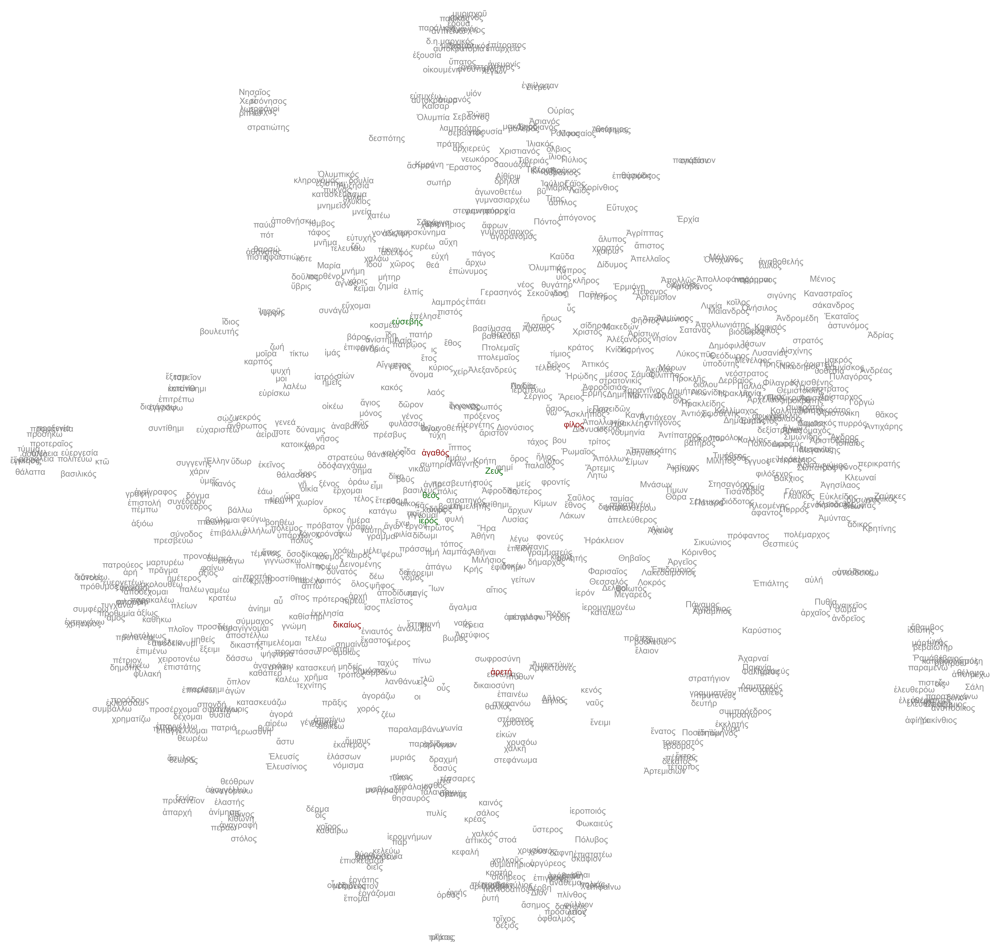

In [111]:
fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
#ax.set_facecolor("#F2F5FA")
ax.axis("off")
#ax.add_artist(ax.patch)
#ax.patch.set_zorder(-1)

In [112]:
fig.savefig("../figures/full_model_ppmisvd_large.png")

In [169]:
corpus = NgramCorpusBows()
term_doc_mat = corpus2csc(corpus)
vocabulary = list(dictionary.values())
cooc = np.dot(term_doc_mat, term_doc_mat.T)
pmi_matrix = ppmi_svd.get_ppmi_df(cooc, vocabulary)
pmi_matrix["θεός"].sort_values(ascending=False)[1:11].mean()


In [168]:
term_doc_mat.shape

(1000, 1927501)

In [166]:
cooc = np.dot(term_doc_mat, term_doc_mat.T)

In [167]:
cooc.shape

(1000, 1000)

In [ ]:
%%time
cooc, vocabulary, pmi_matrix, keyed_vectors, pmi_svd_cos = ppmi_svd.from_bows_to_embeddings(corpus, dictionary)

# Word2Vec

In [69]:
class NgramCorpus:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    yield line.split()

In [154]:
len(ids_list)

50000

In [146]:
corpus = NgramCorpus()

In [147]:
corpus_len = len([doc for doc in corpus])

In [148]:
model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=10, workers=8)

In [149]:
model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))

In [150]:
model.train(corpus, total_examples=corpus_len, epochs=model.epochs)

(29810536, 60827810)

In [151]:
keyed_vectors_w2v = model.wv

In [152]:
keyed_vectors_w2v.save("../data/large_files/vectors_word2vec/full_model.wv")

In [124]:
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_w2v, perplexity=15)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(0.0, 1.0, 0.0, 1.0)

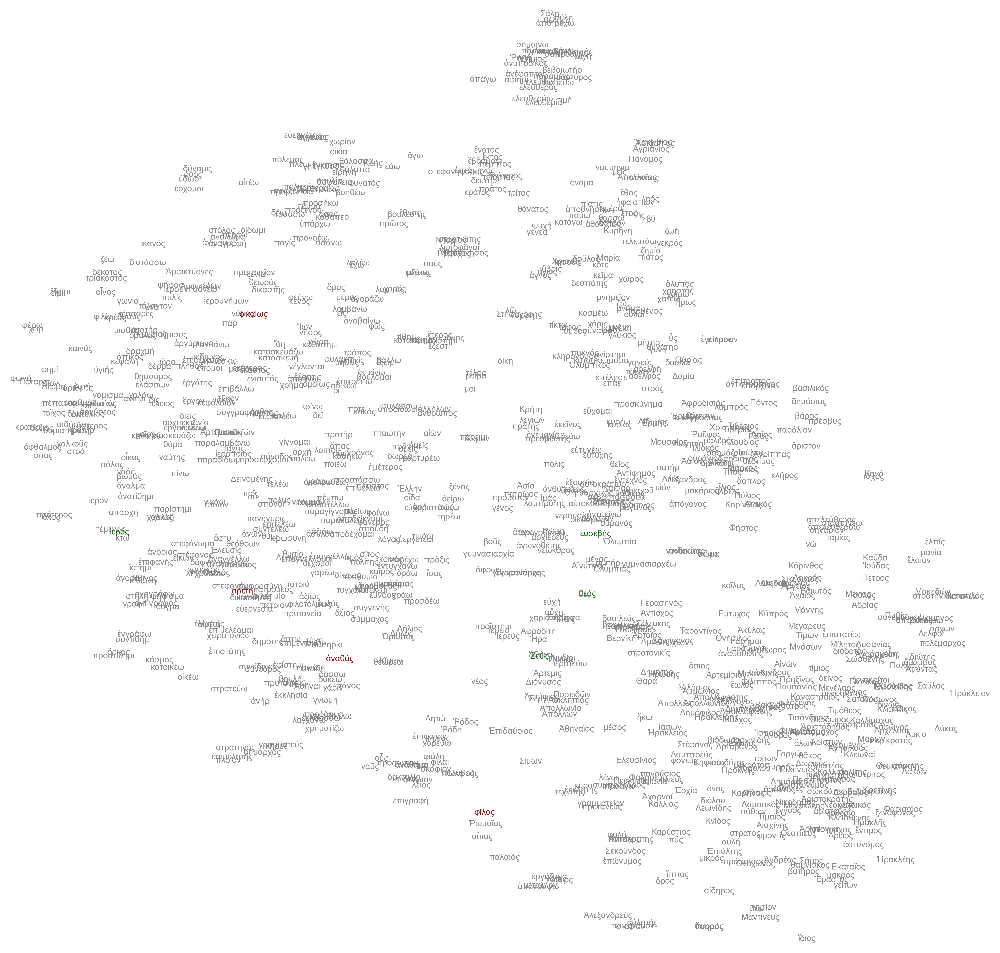

In [125]:
fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.axis("off")

In [126]:
fig.savefig("../figures/full_model_word2vec_large.png")

# FastText

In [139]:
model = FastText(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8, min_n=4)
model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
model.train(corpus, total_examples=corpus_len, epochs=model.epochs)

(14904914, 30413905)

In [129]:
keyed_vectors_ft = model.wv
xs, ys, words = ppmi_svd.get_tsne_coors(keyed_vectors_ft, perplexity=15)

/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [140]:
keyed_vectors_ft.save("../data/large_files/vectors_fasttext/model_full.wv")

(0.0, 1.0, 0.0, 1.0)

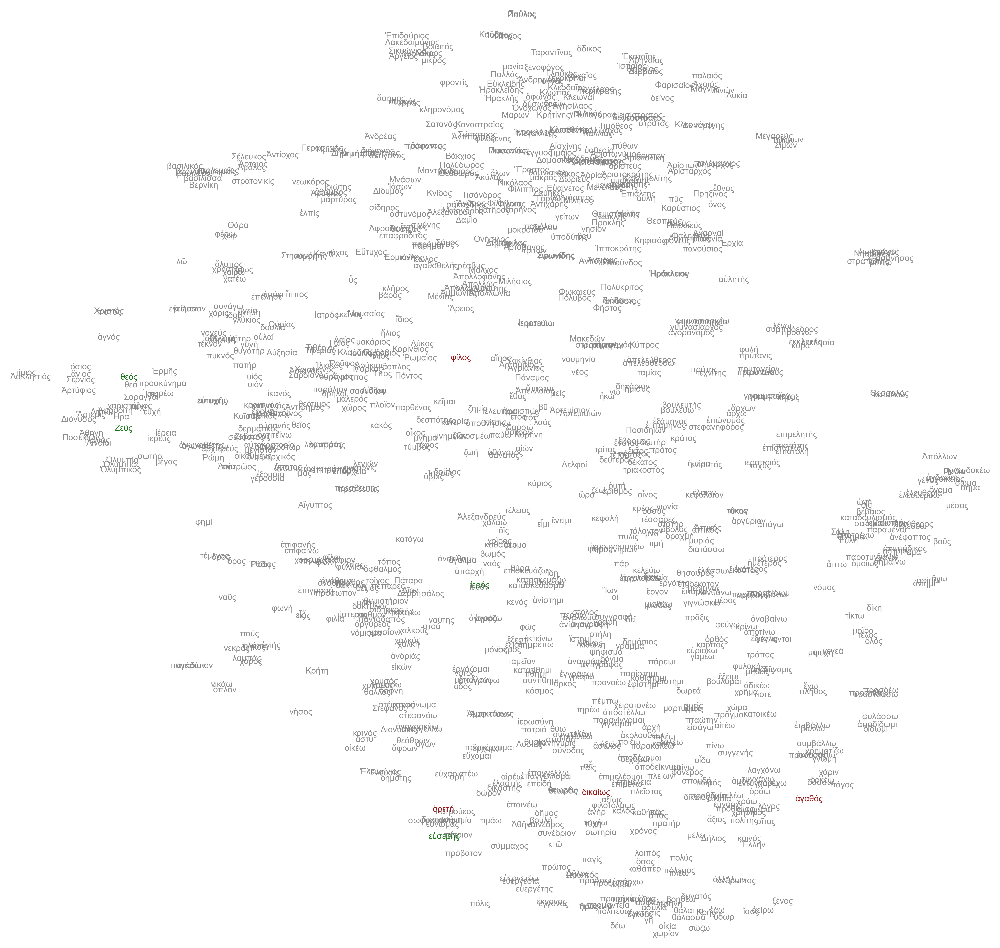

In [130]:
fig, ax = plt.subplots(1,1, figsize=(12,12), dpi=600, frameon=False)
cutoff = 0
border = 0
for x, y, word in zip(xs, ys, words):
    if (cutoff <= x <= 1-cutoff) and (cutoff <= y <= 1-cutoff):
        ax.text(x, y, word, horizontalalignment='center', color=word_color_dict[word], alpha=0.9, fontsize=6)#fontsize=word_size_dict[word], color=word_color_dict[word], alpha=0.9)
ax.set_xlim(cutoff-border, 1-cutoff+border)
ax.set_ylim(cutoff-border, 1-cutoff+border)
ax.axis("off")

In [131]:
fig.savefig("../figures/full_model_fasttext_large.png")

# Century excluding models - fasttext

In [160]:
for cent_to_exclude in cent_ids_samples.keys():
    ids_list = []
    for key in cent_ids_samples.keys():
        if key != cent_to_exclude:
            ids_list.extend(list(cent_ids_samples[key]))
    ids_list = [str(id) for id in ids_list]
    print(len(ids_list))
    corpus = NgramCorpus()
    model = FastText(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8, min_n=4)
    model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
    print("going to train model excluding {} century".format(str(cent_to_exclude)))
    model.train(corpus, total_examples=corpus_len, epochs=model.epochs)
    model.wv.save("../data/large_files/vectors_fasttext/model_without_{}.wv".format(str(cent_to_exclude)))

45000
going to train model excluding -6 century
45000
going to train model excluding -5 century
45000
going to train model excluding -4 century
45000
going to train model excluding -3 century
45000
going to train model excluding -2 century
45000
going to train model excluding -1 century
45000
going to train model excluding 0 century
45000
going to train model excluding 1 century
45000
going to train model excluding 2 century
45000
going to train model excluding 3 century


# Century excluding models - word2vec


In [143]:
!mkdir ../data/../data/large_files/vectors_word2vec

In [155]:
for cent_to_exclude in cent_ids_samples.keys():
    ids_list = []
    for key in cent_ids_samples.keys():
        if key != cent_to_exclude:
            ids_list.extend(list(cent_ids_samples[key]))
    ids_list = [str(id) for id in ids_list]
    print(len(ids_list))
    corpus = NgramCorpus()
    model = Word2Vec(vector_size=150, window=3, negative=5, ns_exponent=1, sg=0, epochs=5, workers=8)
    model.build_vocab_from_freq(word_freq=dict(freqs_tups[:N_types_covered]))
    print("going to train model excluding {} century".format(str(cent_to_exclude)))
    model.train(corpus, total_examples=corpus_len, epochs=model.epochs)
    model.wv.save("../data/large_files/vectors_word2vec/model_without_{}.wv".format(str(cent_to_exclude)))

45000
going to train model excluding -6 century
45000
going to train model excluding -5 century
45000
going to train model excluding -4 century
45000
going to train model excluding -3 century
45000
going to train model excluding -2 century
45000
going to train model excluding -1 century
45000
going to train model excluding 0 century
45000
going to train model excluding 1 century
45000
going to train model excluding 2 century
45000
going to train model excluding 3 century


# Century excluding models - PPMI-SVD

In [14]:
class NgramCorpusBows:
    def __iter__(self):
        with open("../data/large_files/corpus_ngrams.txt", "r") as f:
            lines = f.readlines()
            for phi_id in ids_list:
                for line in lines[ids_lines[phi_id][0] : ids_lines[phi_id][1]]:
                    bow = dictionary.doc2bow(line.split())
                    yield bow

In [158]:
!mkdir ../data/large_files/vectors_ppmisvd

In [15]:
for cent_to_exclude in cent_ids_samples.keys():
    ids_list = []
    for key in cent_ids_samples.keys():
        if key != cent_to_exclude:
            ids_list.extend(list(cent_ids_samples[key]))
    ids_list = [str(id) for id in ids_list]
    print("going to train model excluding {} century".format(str(cent_to_exclude)))
    corpus = NgramCorpusBows()
    cooc, vocabulary, pmi_matrix, keyed_vectors, pmi_svd_cos = ppmi_svd.from_bows_to_embeddings(corpus, dictionary)
    keyed_vectors.save("../data/large_files/vectors_ppmisvd/model_without_{}.wv".format(str(cent_to_exclude)))

going to train model excluding -6 century


KeyboardInterrupt: 

# PMI by centuries

In [16]:
ids_list = [str(id) for id in GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-500,-401)]["PHI_ID"]]

In [17]:
ids_list[:10]

['4', '5', '6', '11', '14', '15', '16', '17', '22', '29']

In [18]:
ids_list = [str(id) for id in GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-500,-401)]["PHI_ID"]]
corpus = NgramCorpusBows()
term_doc_mat = corpus2csc(corpus)
vocabulary = list(dictionary.values())
cooc = np.dot(term_doc_mat, term_doc_mat.T)
pmi_matrix = ppmi_svd.get_ppmi_df(cooc, vocabulary)

In [19]:
worda = religion_final[0]
wordb = morality_final[0]
pmi_matrix[worda][wordb]

0.7796413118988155

In [36]:
GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(-800,-701)]

In [37]:
len(GIST_subset)

61

In [38]:
lemmata_merged = [[l for l in inscr_lem["data"]] for inscr_lem in GIST_subset["lemmata_filtered"].tolist()]
lemmata_merged = [l for i in lemmata_merged for l in i]

In [39]:
def lemmata_list_from_subset(subset_df, n=2000):
    lemmata_merged = [[l for l in inscr_lem["data"]] for inscr_lem in subset_df["lemmata_filtered"].tolist()]
    lemmata_merged = [l for i in lemmata_merged for l in i]
    lemmata_n = [w for w,f in nltk.FreqDist(lemmata_merged).most_common()][:n]
    return lemmata_n

In [40]:
lemmata = lemmata_list_from_subset(GIST_subset)

In [41]:
len(lemmata)

80

In [42]:
dictionary = Dictionary([lemmata])

In [43]:
len(dictionary)

80

In [48]:
time_blocks = [[n, n+100] for n in range(-850, 410, 10)]
time_blocks[:3]

[[-850, -750], [-840, -740], [-830, -730]]

In [68]:
sum([True, False])

1

In [ ]:
%%time
data = []
for block in time_blocks:
    print(block)
    cent_data = {}
    cent_data["center_year"] = np.mean(block)
    GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(block[0],block[1])]
    ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
    corpus = NgramCorpus()
    corpus_len = len([ngram for ngram in corpus])
    for worda in religion_final:
        for wordb in morality_final:
            worda_wordb_count = sum([{worda, wordb}.issubset(set(ngram)) for ngram in corpus])
            cent_data[worda + "&" + wordb + " freq."] = worda_wordb_count / corpus_len
    data.append(cent_data)

[-850, -750]
[-840, -740]
[-830, -730]
[-820, -720]
[-810, -710]
[-800, -700]
[-790, -690]
[-780, -680]
[-770, -670]
[-760, -660]
[-750, -650]
[-740, -640]
[-730, -630]
[-720, -620]
[-710, -610]
[-700, -600]
[-690, -590]


In [ ]:
data_df = pd.DataFrame(data)
data_df.to_json("/data/pair_freq_by_decade.json")

In [ ]:
fig, axs = plt.subplots(4, 1, figsize=(4.45, 3), tight_layout=True)
for n, ax in zip(range(0, 16, 4), axs.ravel()):
    data_df.replace(0, np.nan)[data_df.columns[n:n+4]].plot(ax=ax)
    ax.set_xlabel("")
    ax.set_xticks(range(len(data_df)))
    ax.set_xticklabels([])
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=6)
    ax.set_xticks([el+1 if el==0 else el for el in range(-800,500,100)])
    ax.set_xlim(-825,425)
ax.set_xticklabels([str(el+1) if el==0 else str(el) for el in range(-800,500,100)], rotation=90)
ax.set_xlabel("year")

In [49]:
data = []
for block in time_blocks:
    print(block)
    cent_data = {}
    cent_data["center_year"] = np.mean(block)
    GIST_subset = GIST[GIST["random_dates"].apply(lambda x: x[0]).between(block[0],block[1])]
    lemmata = lemmata_list_from_subset(GIST_subset, n=2000)
    dictionary = Dictionary([lemmata])
    ids_list = [str(id) for id in GIST_subset["PHI_ID"]]
    corpus = NgramCorpusBows()
    dct_subset = Dictionary.from_corpus(corpus, id2word=dictionary)
    term_doc_mat = corpus2csc(corpus, num_terms=len(dct_subset))
    vocabulary = list(dct_subset.values())
    cooc = np.dot(term_doc_mat, term_doc_mat.T)
    pmi_matrix = ppmi_svd.get_ppmi_df(cooc, vocabulary)
    for worda in religion_final:
        try:
            ntop = int(len(vocabulary) / 100)
            top_N_ppmi_avr = pmi_matrix[worda].sort_values(ascending=False)[1:ntop+1].mean()
        except:
            top_N_ppmi_avr = 0
        for wordb in morality_final:
            try:
                worda_wordb_ppmi = pmi_matrix[worda][wordb]
                worda_wordb_ppmi_weighted = worda_wordb_ppmi / top_N_ppmi_avr
            except:
                worda_wordb_ppmi_weighted = 0
            cent_data[worda + "&" + wordb + " MIw"] = worda_wordb_ppmi_weighted
    data.append(cent_data)

[-850, -750]
[-840, -740]
[-830, -730]
[-820, -720]
[-810, -710]
[-800, -700]
[-790, -690]
[-780, -680]
[-770, -670]
[-760, -660]
[-750, -650]
[-740, -640]
[-730, -630]
[-720, -620]
[-710, -610]
[-700, -600]
[-690, -590]
[-680, -580]
[-670, -570]
[-660, -560]
[-650, -550]
[-640, -540]
[-630, -530]
[-620, -520]
[-610, -510]
[-600, -500]
[-590, -490]
[-580, -480]
[-570, -470]
[-560, -460]
[-550, -450]
[-540, -440]
[-530, -430]
[-520, -420]
[-510, -410]
[-500, -400]
[-490, -390]
[-480, -380]
[-470, -370]
[-460, -360]
[-450, -350]
[-440, -340]
[-430, -330]
[-420, -320]
[-410, -310]
[-400, -300]
[-390, -290]
[-380, -280]
[-370, -270]
[-360, -260]
[-350, -250]
[-340, -240]
[-330, -230]
[-320, -220]
[-310, -210]
[-300, -200]
[-290, -190]
[-280, -180]
[-270, -170]
[-260, -160]
[-250, -150]
[-240, -140]
[-230, -130]
[-220, -120]
[-210, -110]
[-200, -100]
[-190, -90]
[-180, -80]
[-170, -70]
[-160, -60]
[-150, -50]
[-140, -40]
[-130, -30]
[-120, -20]
[-110, -10]
[-100, 0]
[-90, 10]
[-80, 20]
[-70

In [50]:
data_df = pd.DataFrame(data)

In [51]:
#data_df.to_json("../data/ppmi_by_decade.json")

In [66]:
#data_df = pd.read_json("../data/ppmi_by_decade.json")

,center_year,θεός&ἀγαθός MIw,θεός&ἀρετή MIw,θεός&δίκαιος MIw,θεός&τιμή MIw,Ζεύς&ἀγαθός MIw,Ζεύς&ἀρετή MIw,Ζεύς&δίκαιος MIw,Ζεύς&τιμή MIw,εὐσεβής&ἀγαθός MIw,εὐσεβής&ἀρετή MIw,εὐσεβής&δίκαιος MIw,εὐσεβής&τιμή MIw,ἱερός&ἀγαθός MIw,ἱερός&ἀρετή MIw,ἱερός&δίκαιος MIw,ἱερός&τιμή MIw
0,-800,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,-790,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,-780,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,-770,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,-760,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,410,0.900275,0.821913,0.755264,0.776696,0.670531,0.718452,0.0,0.0,0.000000,0.000000,0.0,0.757583,0.893181,0.000000,0.732413,0.792307
122,420,0.895149,0.829964,0.767202,0.788870,0.695925,0.737201,0.0,0.0,0.000000,0.000000,0.0,0.777359,0.904485,0.000000,0.752793,0.788910
123,430,0.895096,0.835990,0.775351,0.794412,0.699961,0.743149,0.0,0.0,0.000000,0.000000,0.0,0.789903,0.904979,0.783446,0.763516,0.796747
124,440,0.881459,0.839796,0.778250,0.759334,0.716840,0.808290,0.0,0.0,0.000000,0.000000,0.0,0.783107,0.907400,0.812611,0.000000,0.816087


In [58]:
data_df.set_index("center_year", inplace=True)

Text(0.5, 0, 'year')

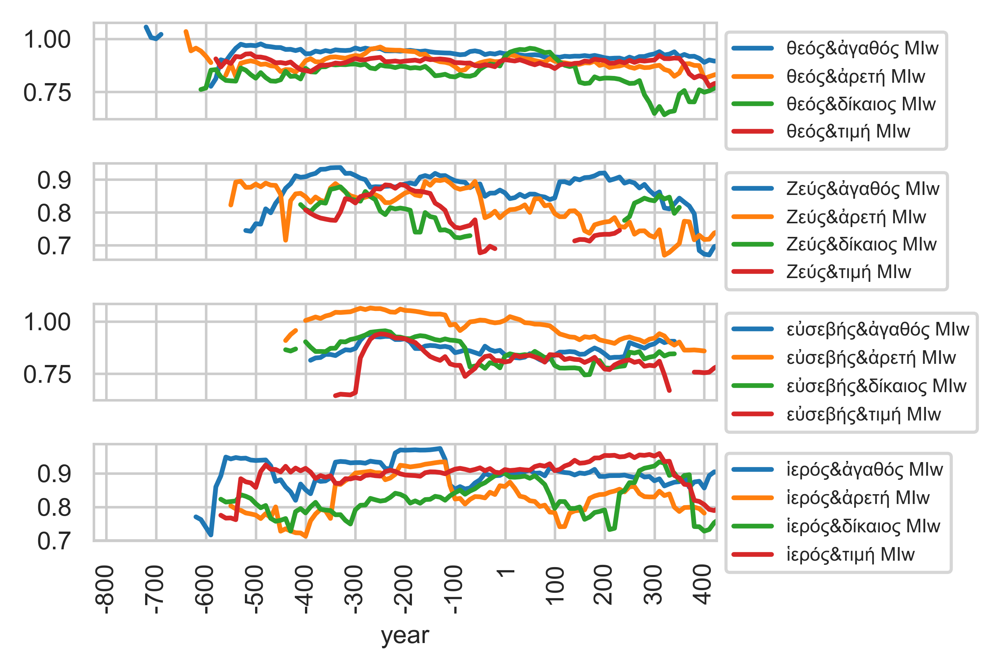

In [64]:
fig, axs = plt.subplots(4, 1, figsize=(4.45, 3), tight_layout=True)
for n, ax in zip(range(0, 16, 4), axs.ravel()):
    data_df.replace(0, np.nan)[data_df.columns[n:n+4]].plot(ax=ax)
    ax.set_xlabel("")
    ax.set_xticks(range(len(data_df)))
    ax.set_xticklabels([])
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=6)
    ax.set_xticks([el+1 if el==0 else el for el in range(-800,500,100)])
    ax.set_xlim(-825,425)
ax.set_xticklabels([str(el+1) if el==0 else str(el) for el in range(-800,500,100)], rotation=90)
ax.set_xlabel("year")

In [65]:
save_figure(fig, "keywords_MIw_by_decade")